<center> <h1> <b> Digital Signal Processing (EE2800) </b> </h1> </center>


<dt> <h4>
 <b> Programming Assignment (01) : Digitization of Signals – Sampling and Quantization </b> </h4> </dt> 
 
<dt> <h4> Welcome to the first programming assignment (PA) on Digital Signal Processing (EE2800) course. The objective of this PA is to investigate the effects of sampling and quantization on some of the natural signals. The major objectives of this PA are as follows: </h4> </dt> 

<dd> <h4> 1. Synthesizing sinusoidal signals, and observing effect of sampling on sinusoids. </dd> </h4>

<dd> <h4> 2. Effects of sampling on audio signals, speech signals and digital images. </dd> </h4>

<dd> <h4> 3. Effects of quantization on audio signals, speech signals and digital images </dd> </h4>




<dt> <h4> <b> Instructions </b> </dt> </h4>

<dd> <h4> 1. Plagiarism is strictly prohibited. </h4> </dd> 
<dd> <h4> 2. Delayed submissions will be penalized with a scaling factor of 0.5 per each hour. </h4> </dd> 
<dd> <h4> 3. Deadline will not be be extended under any circumstances </h4> </dd> 


[link to audio, speech and digital images required for this PA](https://drive.google.com/drive/folders/1VsDQ2GR4RXIsiiRipJGTafMsRlLpwDSv?usp=sharing)


<h4> <b> Part (1) : Synthesizing sinusoids and observing the effect of sampling on sinusoids : </b>  

<h4> <b> Objective : </b>  

<dt> <h4> In this experiment, you have to take a closer look at the behavior of discrete-time sinusoids from a sampling view point. Often a discrete-time signal is produced by sampling a continuous time (analog) signal, such as a constant frequency sinusoid. The relation between the frequency of the sinusoid, and the sampling frequency is the essence of the Nyquist-Shannon theorem, which requires that the sampling frequency should be at least twice the highest frequency in the signal for perfect reconstruction. In general, a continuous-time sinusoid is expressed as </h4> </dt>
<center> x(t) = A cos(2π$f_{0}$t + Φ) $\hspace{5cm}$ (1) </center> 
<dt> <h4> where A is the amplitude, $f_0$ is the frequency of the sinusoid in Hertz, t is continuous time, and φ is the phase. Since this signal is an analog signal, there are infinite values in any finite interval of time. So we cannot represent a continuous time sinusoid in a digital computer. A continuous time sinusoid has to be necessarily digitized in order to represent it in a digital computer. </h4> </dt> 

<dt> <h4> In this experiment, we synthesize discrete-time sinusoidal signals by measuring the analog signal, or in our case evaluating the sinusoid, at constant intervals of time. This is called uniform sampling, and the time interval $T_{s}$ is called the sampling period. The sampling frequency is therefore $F_{s} = \frac{1}{T_{s}}$. The discrete-time sinusoid that is obtained by sampling the continuous time sinusoid in equation 1 at discrete instants of time t = n$T_{s}$ is given by
</h4> </dt>

<center> $ x[n] = x(nT_{s}) = A cos(2πf_{0}nT_{s} + Φ) = A cos(2π\frac{f_{0}}{f_{s}}n + Φ) $ </center> 

<dt> <h4> It is important to notice that the signal, thus generated, is a sequence of numbers, and not a continuous curve. The discrete-time signal is not defined in between any two successive time indexes, say k and k+1. It is wrong to think that the value of the discrete-time signal in between
two successive time indexes is zero. </h4> </dt>

<h4> <b> Programming Questions : </b>  


<dt> <h4> i. Keeping a fixed sampling frequency of $f_s$ = 8 kHz, generate sinusoids with frequency $f_0$ = 1, 2, 3, 3.5, 4, 5, 6 and 7 kHz. Plot the sinusoids on separate figures. Why are some of these plots similar? Do they reflect the true frequency content, i.e. the frequency of the analog sinusoids? </h4> </dt>


<dt> <h4> ii. Create a new discrete-time sinusoidal signals, y[n], at the same frequencies mentioned in part (a), but sampled at a ten-fold frequency, say fs = 80 kHz, and extending over the same interval of time as x[n], i.e. if x[n] had N samples, y[n] should have 10xN samples. Plot the x[n] and y[n] sequences corresponding to the same frequency on the same figure, in a superposed fashion, using different colors. Can you now give a time-domain explanation? </h4> </dt>









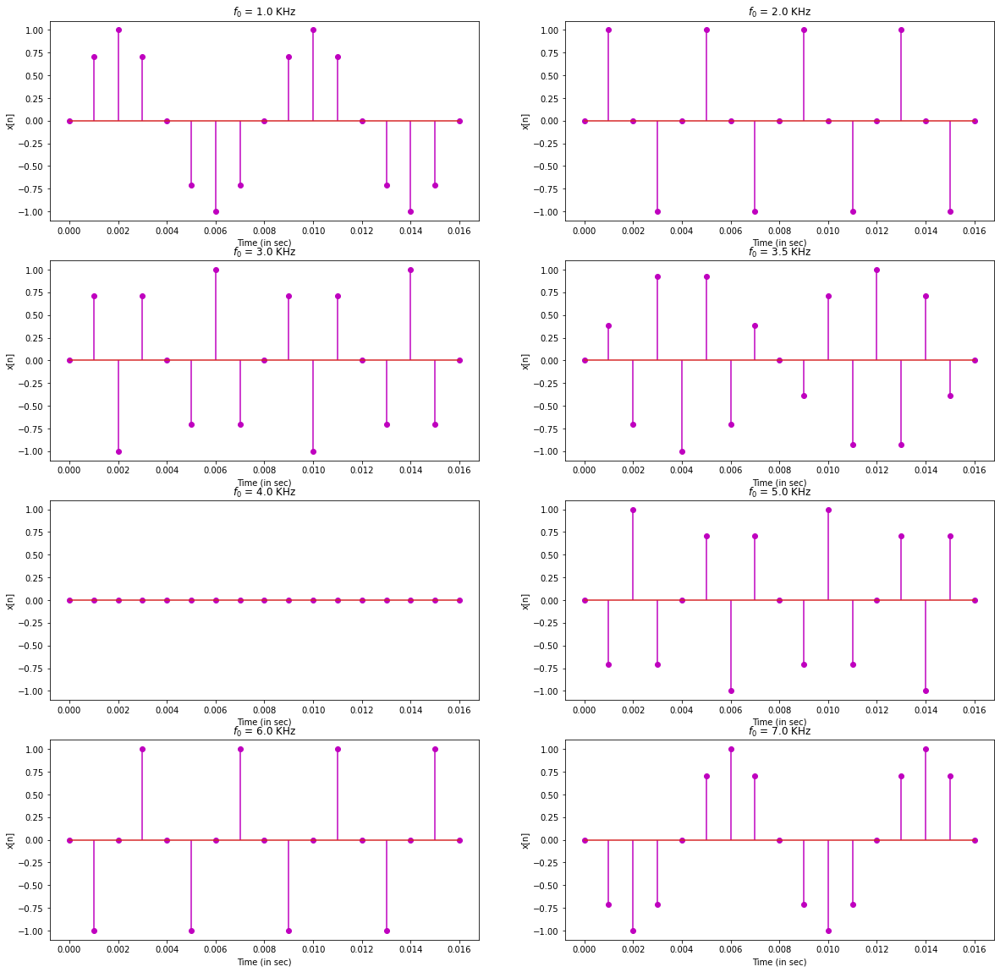

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx 



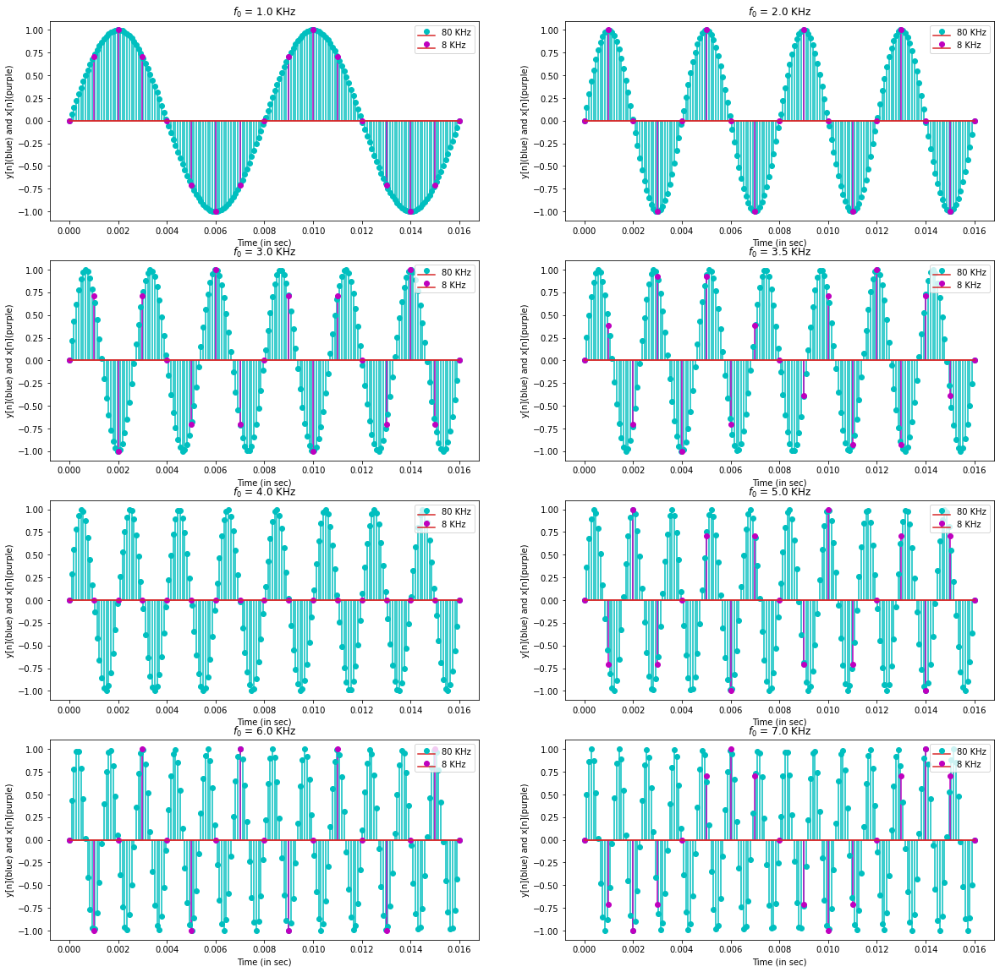

In [ ]:
#All imports
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
from IPython.display import Audio, display
import soundfile as sf
import matplotlib.image as mpimg
import warnings
warnings.filterwarnings('ignore')


#(i)
t  = np.linspace(0,16*1e-3,17) #numpy array of discrete instants of time
f = np.array([1000,2000,3000,3500,4000,5000,6000,7000]) #numpy array of sinusoidal  frequencies
fs = 8000 #Define the sampling frequency

plt.figure(figsize=(20,20)) #Define the figure size

#Iterate through the frequencies and plot the sinusoids in subplots
for index in range(0,len(f),1):
    plt.subplot(4,2,index+1); #It covers a total of 8 plots
    #Generate the sinusoid with f[index] as frequency. You may use np.sin() function.
    x = np.sin(2*np.pi*f[index]/fs*t*1000)

    #Plot the generated sinusoidal data. Hint: plt.stem() plots the discrete data 
    plt.stem(t,x,"m",use_line_collection = True,markerfmt="mo")
    
    plt.title(f"$f_0$ = {f[index]/1000} KHz")
    plt.xlabel("Time (in sec)")
    plt.ylabel("x[n]")
    plt.ylim(-1.1,1.1)

plt.show()

#(ii)
print('x'*150,'\n')

t_80  = np.linspace(0,16*1e-3,170)

plt.figure(figsize=(20,20))

for index in range(0,len(f),1):
  plt.subplot(4,2,index+1)

  y = np.sin(2*np.pi*f[index]/fs*t_80*1000)
  x = np.sin(2*np.pi*f[index]/fs*t*1000)

  plt.stem(t_80,y,"c",use_line_collection = True,markerfmt="co",label="80 KHz")
  plt.stem(t,x,"m",use_line_collection = True,markerfmt="mo",label="8 KHz")
  
  plt.title(f"$f_0$ = {f[index]/1000} KHz")
  plt.xlabel("Time (in sec)")
  plt.ylabel("y[n](blue) and x[n](purple)")
  plt.ylim(-1.1,1.1)
  plt.legend(loc="upper right")

plt.show()

<h4> <b> Report your observations : </b> <h4>

<h5> i. The plots obtained for $f_0$ = 1kHz and 7kHz; 2kHz and 6kHz; 3kHz and 5kHz are similar but negative of each other. This is because:

$ \sin(2\pi n \frac{f_s-f_o}{f_s}) = \sin(2\pi n - 2\pi n\frac{f_o}{f_s}) = -\sin(2\pi n\frac{f_o}{f_s}) $

Hence, $f_o$ and $f_s-f_o$ will be negative plots of each other.

Therefore, when we reconstruct 5kHz, 6kHz and 7kHz signals, we get 3kHz, 2kHz and 1kHz signals respectively.</h5>

<dt> <h5> ii. According to Nyquist Sampling Theorem, we must sample it at a frequency greater than twice its maximum frequency to reconstruct the signal. The plots for $f_0$= 4kHz, 5kHz, 6kHz and 7kHz do not reflect the true frequency of the analog sinusoids because they have been sampled at $f_s$= 8kHz, which is not greater than twice the maximum frequency component. </h5> </dt>
<img title="a title" alt="Alt text" src="https://www.researchgate.net/profile/Paul-Sampson-2/publication/254653615/figure/fig1/AS:297857543360514@1448026180488/Example-of-aliasing-due-to-undersampling-in-space.png" width="400">

<dt> <h5> iii. For $f_s$=80 kHz, the Nyquist Sampling Criterion is met for all frequencies($f_o$) since $f_s > 2f_o$. Hence, we can reconstruct the input analog sinusoid perfectly as there is no aliasing. Also, from the second set of plots, we can clearly see that the frequencies 4kHz, 5khZ, 6kHz and 7kHz are not sampled adequately which we could not make out in the first set of plots. </h5> </dt>



<h4> <b> Part (2) : Effect of sampling on audio signals, speech signals and digital images : </b> 
<h4> <b> Objective : </b>  

<dt> <h4> In this experiment we study the effects of sampling frequency on human perception of audio/speech signals. </h4> </dt>

<h4> <b> Programming Questions : </b>  

<dt> <h4> i. Use Python's soundfile.read() function to read wave files. The provided music wave file is sampled at 32 kHz and speech wave file is sampled at 16 kHz. Define a downsampling rate as, say, dsr=2 and create downsampled version of the audio signal. Save or play the downsampled signal with 32000/dsr as new sampling frequency, since the signal has been downsampled by dsr. Does the music sound different? What is the audible effect of downsampling? What happens for dsr values of 2, 4, 8, 16, 32 or more? </h4> </dt>
<dt> <h4> Hint : Downsampling with dsr=2 can be done by taking alternative values of the signal. Similarly, we can achieve downsampling with dsr=N by taking one value in each contiguous N sample. </h4> </dt>
<dt> <h4> ii. Repeat part (i) for the speech signal, and note down your observations. Compare your observations with audio signals. </h4> </dt>
<dt> <h4> iii. Repeat sampling experiments for digital images. Hint: You can think of pixels in digital image as samples in audio / speech signals. </h4> </dt>


<h4> <b> NOTE : </b>  Code snippets to access audio, speech, and digital images are provided here for your reference. Please notice that it is not mandatory to use the same packages to load the signals. For example, if you are familiar with other packages (OpenCV) to load the signals (images), you are free to use them in this PA. 



Mounted at /content/drive
Music without Downsampling


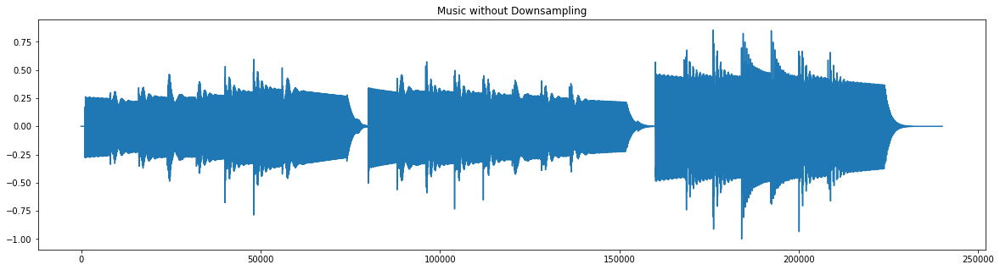



Music Signal with Downsampling Rate=2


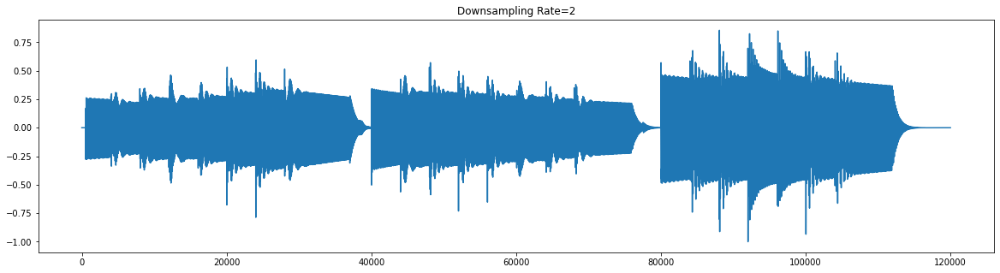



Music Signal with Downsampling Rate=4


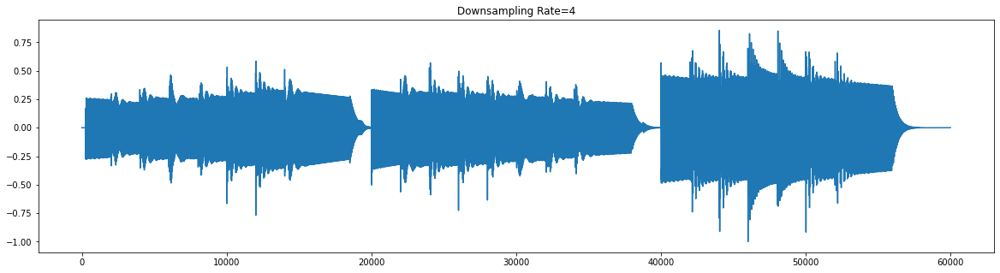



Music Signal with Downsampling Rate=8


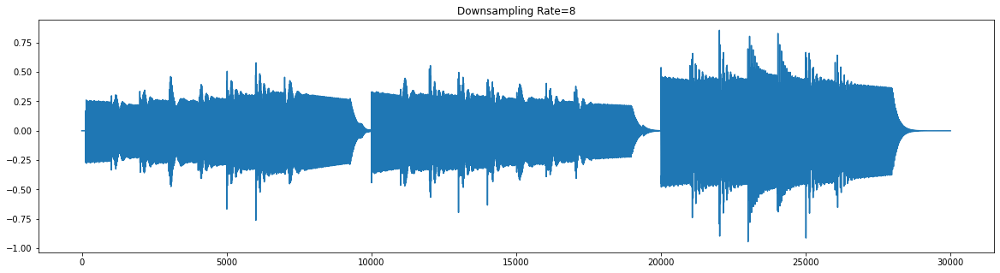



Music Signal with Downsampling Rate=16


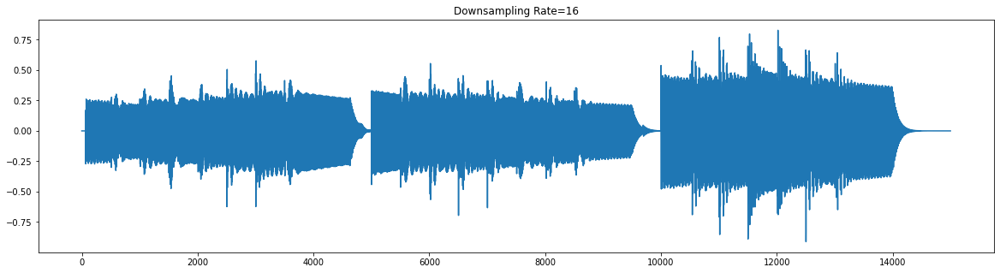



Music Signal with Downsampling Rate=32


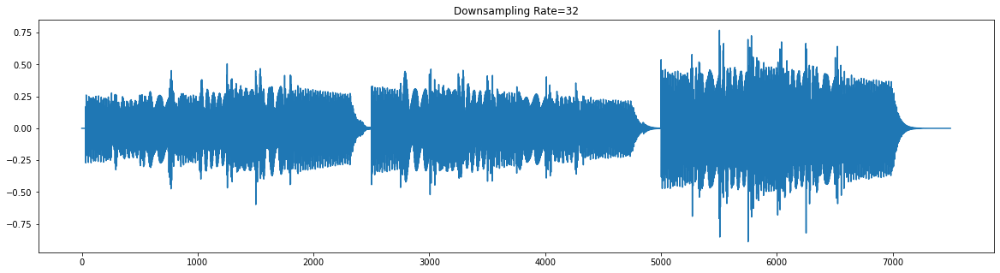



Music Signal with Downsampling Rate=64


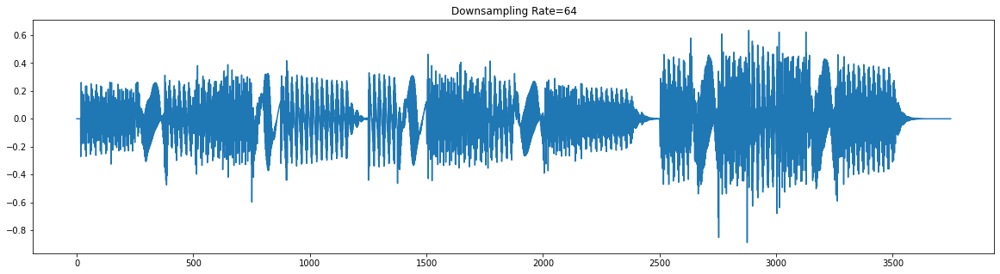



Music Signal with Downsampling Rate=128


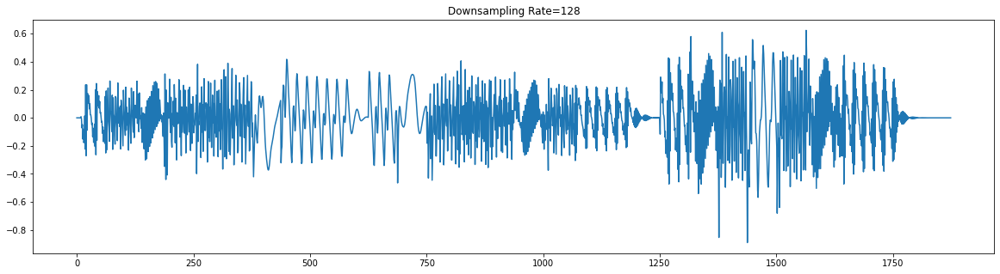



Music Signal with Downsampling Rate=256


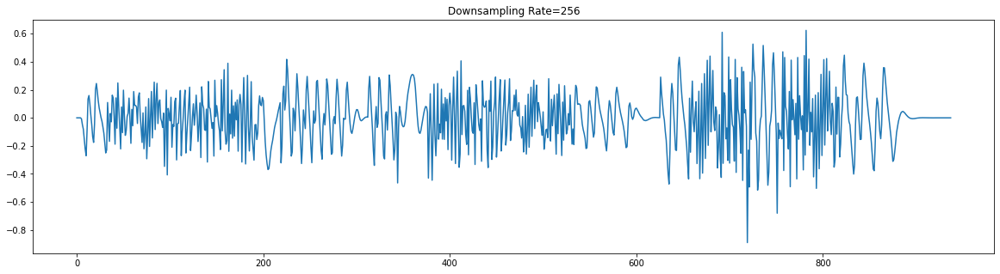



xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx 

Speech without Downsampling


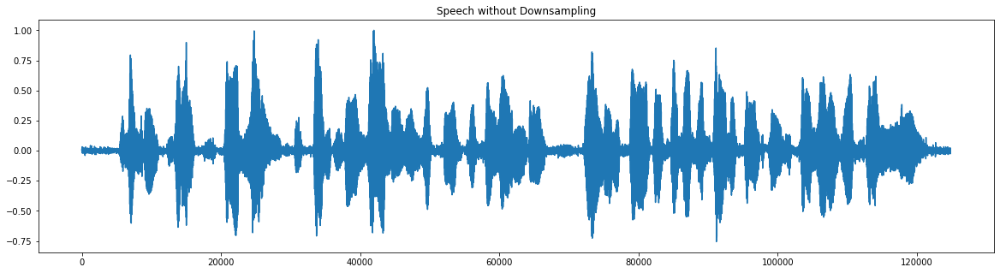



Speech Signal with Downsampling Rate=2


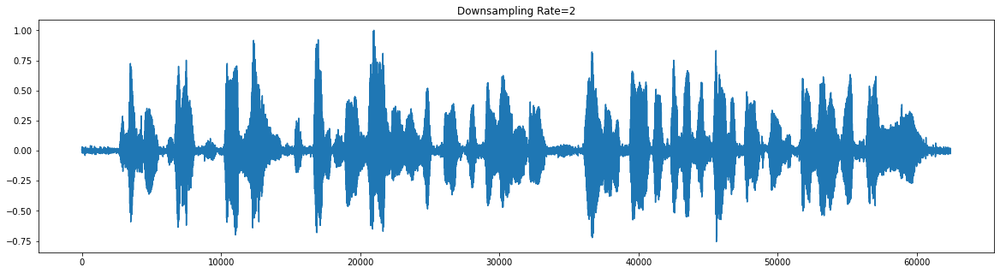



Speech Signal with Downsampling Rate=4


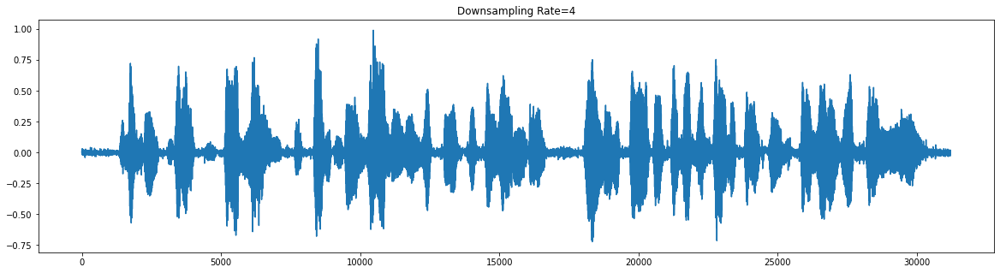



Speech Signal with Downsampling Rate=8


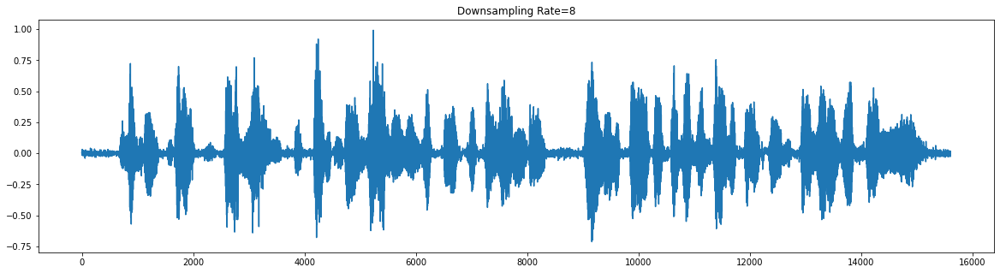



Speech Signal with Downsampling Rate=16


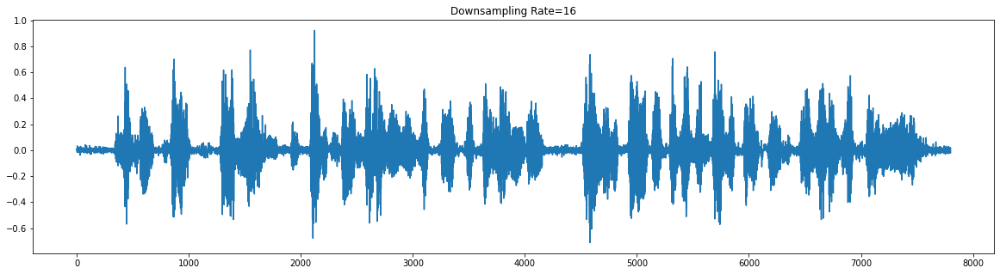



Speech Signal with Downsampling Rate=32


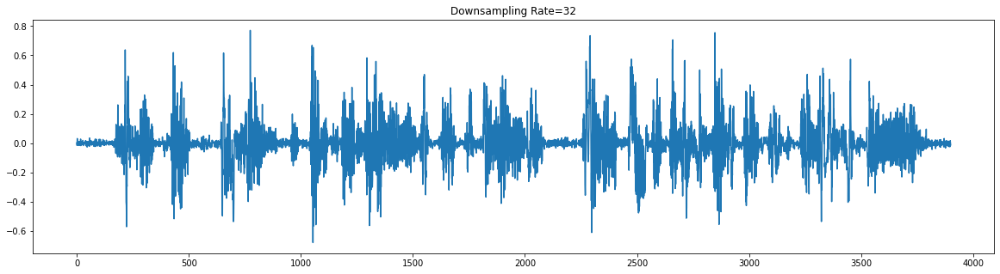



Speech Signal with Downsampling Rate=64


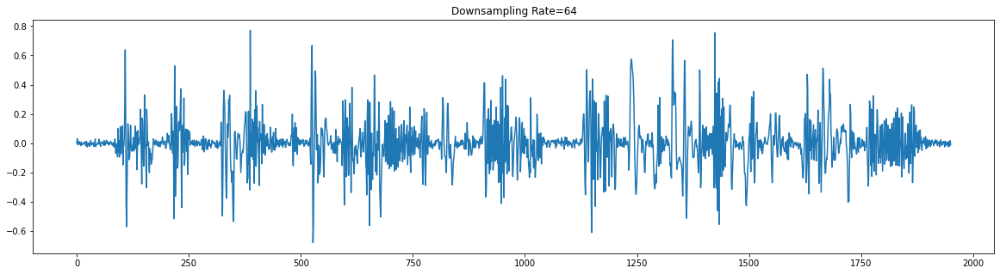



Speech Signal with Downsampling Rate=128


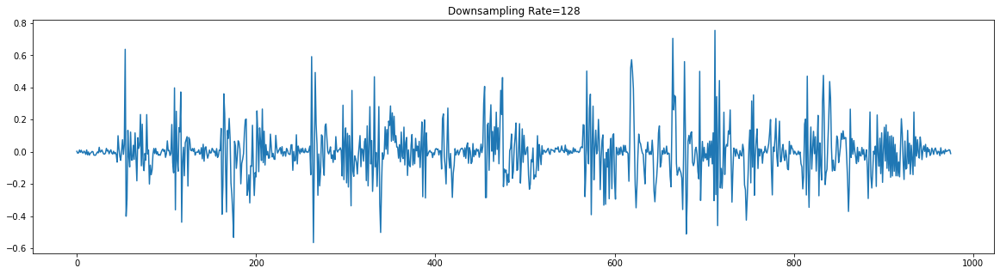



xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx 



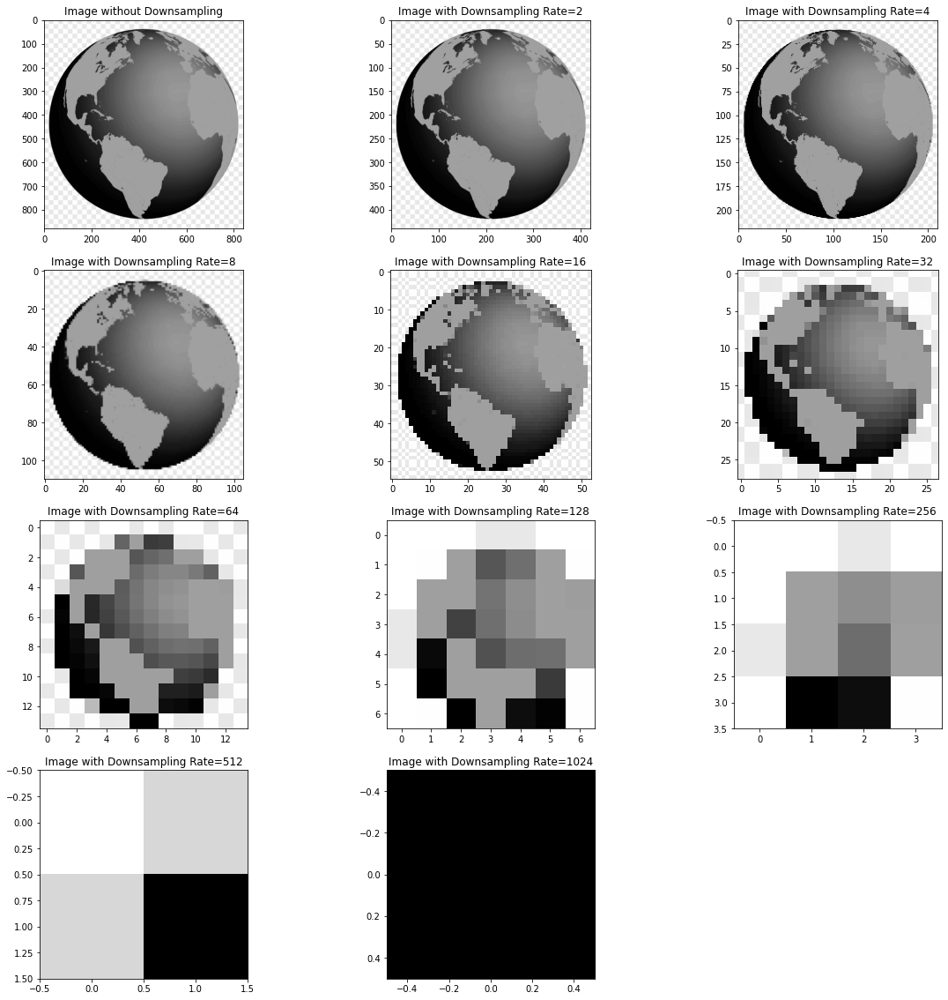

In [ ]:
from posixpath import join
#(i)
#########################################
#Write a function called downsample(arg1,arg2) that takes signal and the dsr as input and produces the downsampled signal. 
#Notice that the length of downsampled signal dsr times less than the length of the original signal
#It is important to save the downsampled signal with sampling frequency as dsr times less than the original signal sampling frequency since the signal has been downsampled by dsr.
#########################################
def downsample(signal,N):
    #########################################
    #Perform downsampling operation
    #########################################
    if len(signal.shape) == 1: #audio is a vector, hence dimension=1
      signal_downsampled = np.zeros(int(np.ceil((len(signal)/N))))
      for i in range(0,int(np.ceil((len(signal)/N)))):
        signal_downsampled[i] = signal[i*N]
    
    if len(signal.shape) == 3: #image is a matrix with RGB channels, hence dimension=3
      signal = signal[:,:,0] #taking 1 channel since all 3 channels are identical in grayscale

      signal_downsampled = np.zeros((int(np.ceil(len(signal)/N)),int(np.ceil(len(signal[0])/N))), dtype=int)
      for i in range(0,int(np.ceil(len(signal)/N))):
        for j in range(0,int(np.ceil(len(signal[0])/N))):
          signal_downsampled[i][j] = signal[i*N][j*N]

    #########################################
    #return the downsampled signal
    #########################################
    return signal_downsampled

#########################################
#Load audio / speech signals
#########################################
drive.mount('/content/drive',force_remount=True)
music, srate_m = sf.read('/content/drive/MyDrive/DSP/PA01/music.wav')

#########################################
#Call the function downsample() with audio / speech signal and dsr as input arguments and obtain the downsampled signal
#########################################
music_downsampled = downsample(music,2) #downsampling with rate=2

#########################################
#plot the original signal and downsampled signal in two different subplots. Hint : You may use plt.subplot(2,1,*)
#########################################
print("Music without Downsampling")
display(Audio("/content/drive/MyDrive/DSP/PA01/music.wav"))
plt.figure(figsize=(20,5))
plt.plot(music)
plt.title("Music without Downsampling")
plt.show()
print("\n")

sf.write('music_downsampled.wav', music_downsampled, srate_m//2)
print("Music Signal with Downsampling Rate=2")
display(Audio('music_downsampled.wav'))
plt.figure(figsize=(20,5))
plt.plot(music_downsampled)
plt.title("Downsampling Rate=2")
plt.show()
print("\n")

#########################################
#Repeat the experiment with different dsr values
#########################################
for i in range(2,9):
    dsr = 2**i
    music_downsampled = downsample(music,dsr)

    sf.write('music_downsampled.wav', music_downsampled, srate_m//dsr)
    print(f"Music Signal with Downsampling Rate={dsr}")
    display(Audio('music_downsampled.wav'))

    plt.figure(figsize=(20,5))
    plt.plot(music_downsampled)
    plt.title(f"Downsampling Rate={dsr}")
    plt.show()
    print("\n")

#(ii)
print('x'*150,'\n')
#########################################
#Repeat part (i) for speech signal 
#########################################
speech, srate_s = sf.read('/content/drive/MyDrive/DSP/PA01/speech.wav')

speech_downsampled = downsample(speech,2) #downsampling with rate=2

print("Speech without Downsampling")
display(Audio("/content/drive/MyDrive/DSP/PA01/speech.wav"))
plt.figure(figsize=(20,5))
plt.plot(speech)
plt.title("Speech without Downsampling")
plt.show()
print("\n")

for i in range(1,8):
    dsr = 2**i
    speech_downsampled = downsample(speech,dsr)

    sf.write('speech_downsampled.wav', speech_downsampled, srate_s//dsr)
    print(f"Speech Signal with Downsampling Rate={dsr}")
    display(Audio('speech_downsampled.wav'))

    plt.figure(figsize=(20,5))
    plt.plot(speech_downsampled)
    plt.title(f"Downsampling Rate={dsr}")
    plt.show()
    print("\n")

#(iii)
print('x'*150,'\n')
#########################################
#Repeat part (i) for digital images
#########################################
plt.figure(figsize=(20,20))

img = mpimg.imread("/content/drive/MyDrive/DSP/PA01/globe.jpg")

plt.subplot(4,3,1)
plt.imshow(img[:,:,0],cmap="gray")
plt.title("Image without Downsampling")

for i in range(1,11):
    dsr = 2**i
    img_downsampled = downsample(img,dsr)

    plt.subplot(4,3,i+1)
    plt.imshow(img_downsampled[:,:],cmap="gray")
    plt.title(f"Image with Downsampling Rate={dsr}")

plt.show()

<h4> <b> Report your observations : </b>  

<dt> <h5> i. For the music.wav signal, we cannot observe any noticeable change for dsr=2,4,8. For dsr>=16, there is a reduction of quality which results in a muffled sound with an echo effect. As dsr increases to very high values, we can barely make out the music beats.

<dt> <h5> ii. For the speech.wav signal, as dsr increases from 2 to 16, her voice gets muffled and a lot of noise creeps in because there is reduction of quality from loss of information. For higher dsr values, we can only hear noise in her speech.</h5> </dt>

<dt> <h5> iii. In the image, for dsr=2 and 4, the downsampled image and the original image are identical to the human eye. For dsr>=8, the image gets pixelated and becomes progressively worse. This is because the information between intermediate pixels is lost. At very high dsr, we can actually count the number of pixels and at dsr>=1024, there is only one pixel of black colour.</h5> </dt>

<dt> <h5> iv. Different browsers have different capabilities and limitations.

In Chrome, downsampled_music.wav does not play for dsr>=16 and downsampled_speech.wav does not play for dsr>=8.

In Mozilla, for higher dsr rates, there is sharp loud sound and audio is not played for the full duration.

In Safari, the audio signals are played clearly even at high dsr and hence, Safari was used to make the above observations.</h5> </dt>



<h4> <b> Part (3) : Effect of quantization on audio signals, speech signals and digital images  : </b>  
<h4> <b> Objective : </b>  

<dt> <h4>
So far, we have looked at the process of sampling signals. Sampling reduces the resolution in time (or space for images) from infinity to a finite number. However, the samples still have an infinite resolution in amplitude. For the case of audio signals studied above, each sample is represented as a 16-bit number. This means that there are only 65536 possible levels: in other words, the resolution in the amplitude is finite. Approximating an infinite precision real world sample measurement by a finite precision computer number is what we call quantization. Quantization leads to a loss in the signal quality, because it introduces a quantization error. In this section, we will try to develop some intuition of this phenomenon.
</dt> </h4>

<h4> <b> Simulating Quantization : </b>  
For the purpose of studying the effects of quantization, we need an easy procedure to manually control the quantization of signals. Assuming that your signal varies in the range [a, b], one practical way of quantizing the signal to $2^N$ possible levels is the following:

<center> $x_q = \{\frac{x-a}{b-a} \cdot ( 2^{N} - 1 ) \} \cdot \frac{b-a}{2^{N} - 1} + a $ </center>

Here, N represents the number of bits to represent the sample value, and {} denotes the rounding operation. The signal range is divided into 2N levels, equally spaced, as such this procedure is called uniform quantization. The equation above (1) reduces the signal to the [0, 1] range, (2) scales the result up to the [0, $2^N$-1] range, (3) approximates values as integers (there are 2N integers in that range), and (4) moves everything back to the [a, b] range.

<h4> <b> Programming Questions : </b>  

<dt> <h4> i. Create a function, quantize(), that takes a vector/matrix, and N as input arguments, and returns the quantized version of each element of that vector/matrix. [ Hint: Try help np.round() ] </h4> </dt>

<dt> <h4> ii. The supplied audio files were quantized at 16 bits per sample. Using the above function create a 4-bit quantized version of the audio files. Play the new signal. What can you say about its quality.? </h4> </dt>


<dt> <h4> iii. Now, instead of playing the quantized signal (at 4-bits), play the difference between the original audio file, and your quantized audio file. What does this sound like? Which one is better? Plot the difference signal, and try intuitively justify why the distortion caused by quantization is sometimes referred as “quantization noise”? </h4> </dt>

<dt> <h4> iv. Repeat the parts (ii) and (iii) for 3-bit, 2-bit, and 1-bit quantized signals. Do you have any special comments on 1-bit quantization? </h4> </dt>


<dt> <h4> v. Repeat the studies on effects of quantization for the gray-scale images supplied to you. Quantize the image to 64, 32, 16, 8, 4 and 2 levels by specifying appropriate values for N. Hint : Use the relation between bits and number of levels in quantization </h4> </dt>





xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx 

Audio Signal without Quantizing


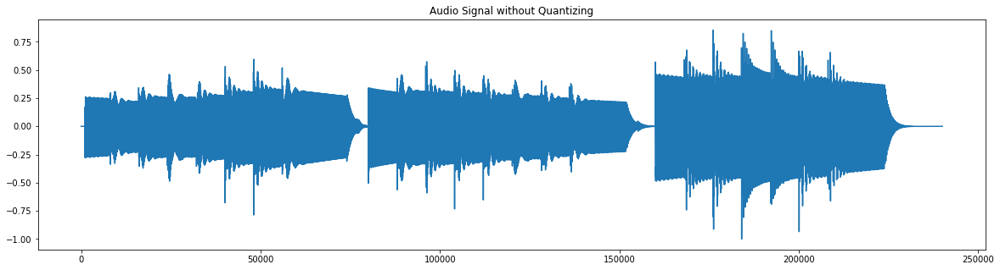



Audio Signal quantized at 4-bits


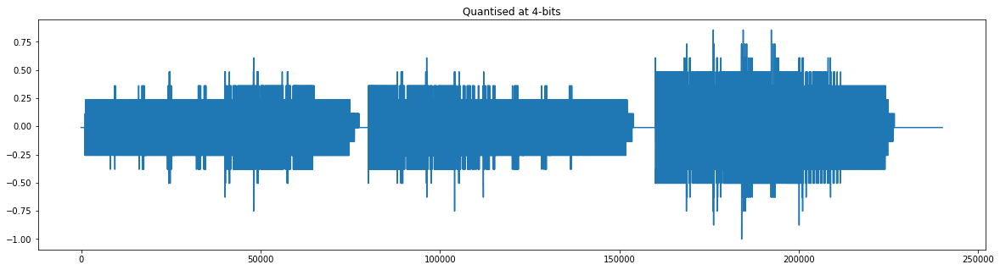



xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx 

Difference between original Audio Signal and 4-bit Quantized Audio Signal


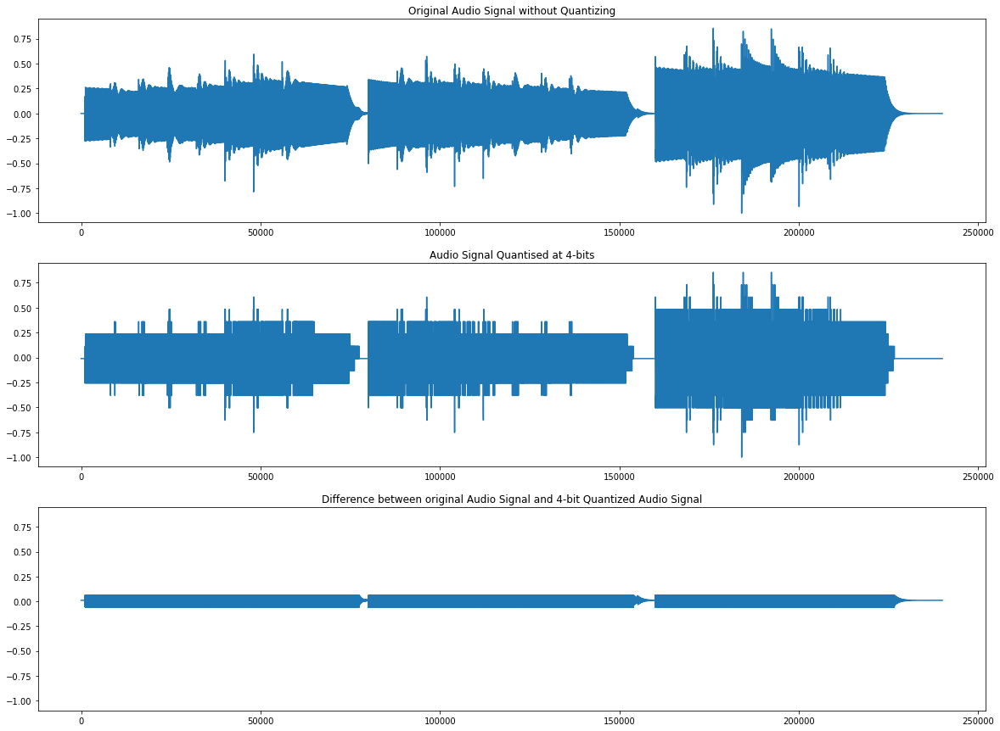



xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx 

Audio without Quantizing


Audio Signal quantized at 3-bits


Difference between original Audio Signal and 3-bit Quantized Audio Signal


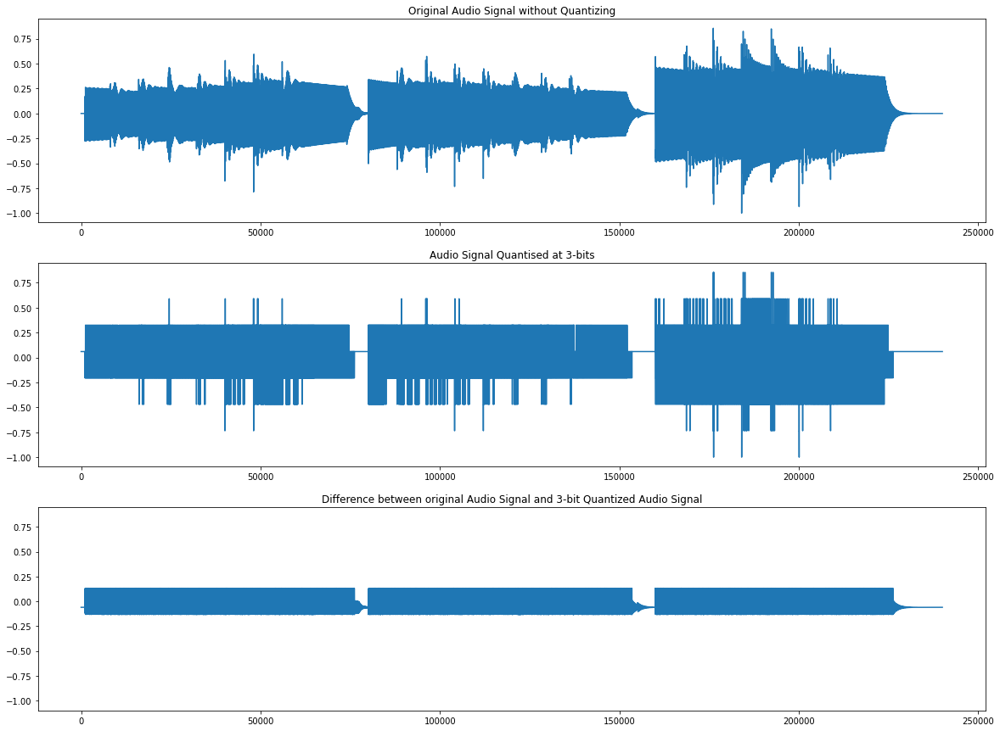



Audio without Quantizing


Audio Signal quantized at 2-bits


Difference between original Audio Signal and 2-bit Quantized Audio Signal


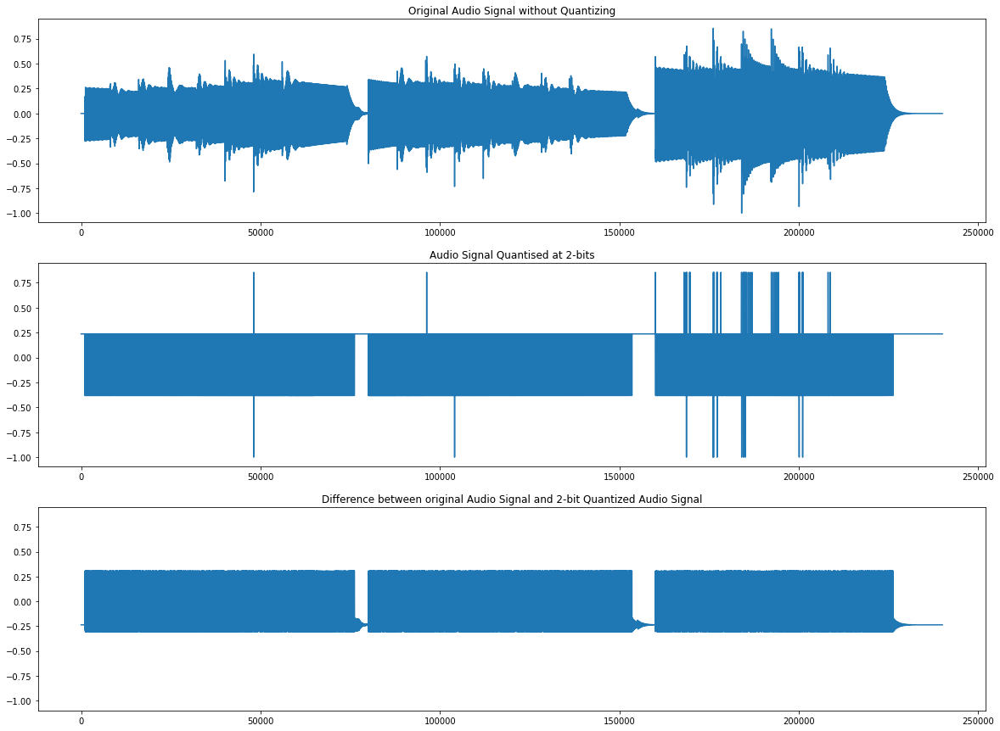



Audio without Quantizing


Audio Signal quantized at 1-bits


Difference between original Audio Signal and 1-bit Quantized Audio Signal


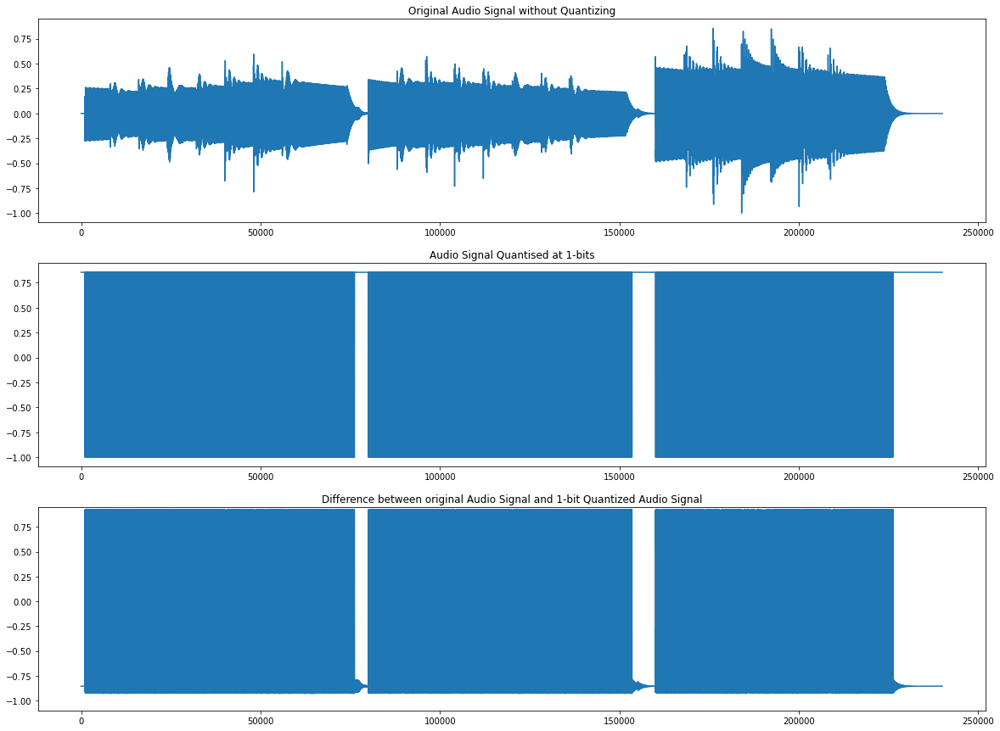



xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx 



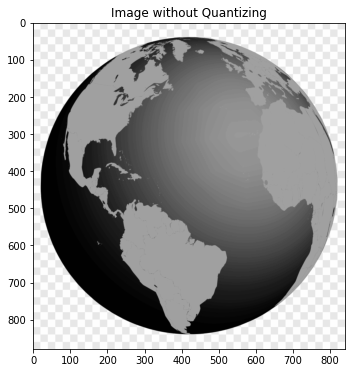

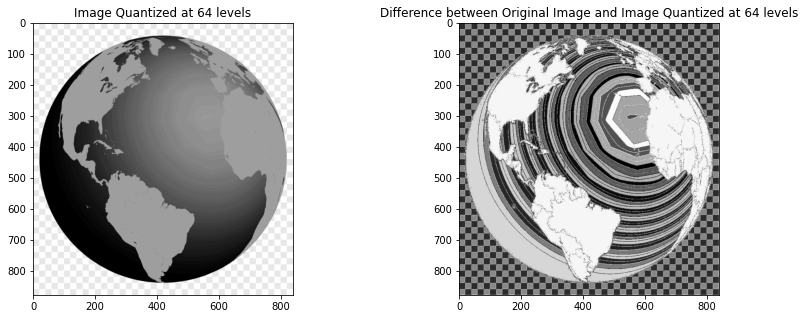

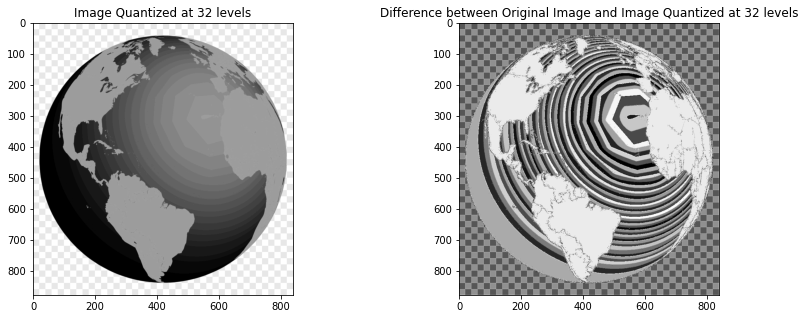

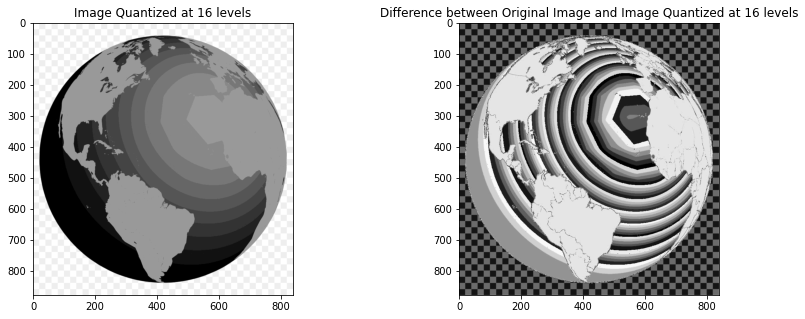

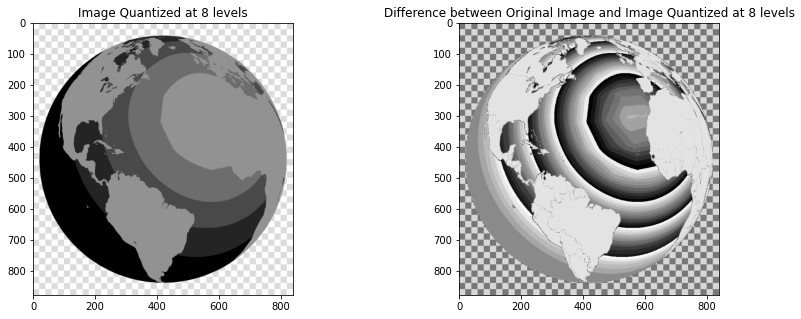

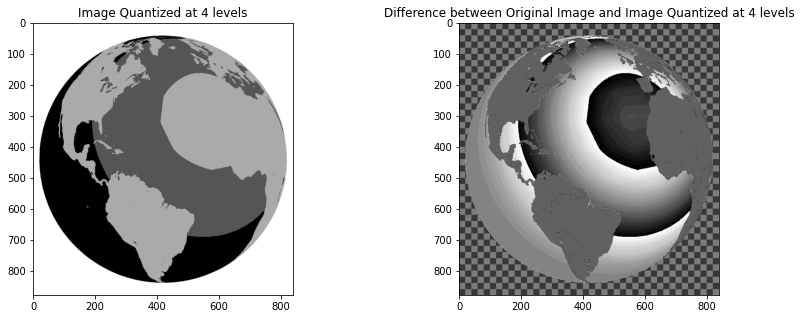

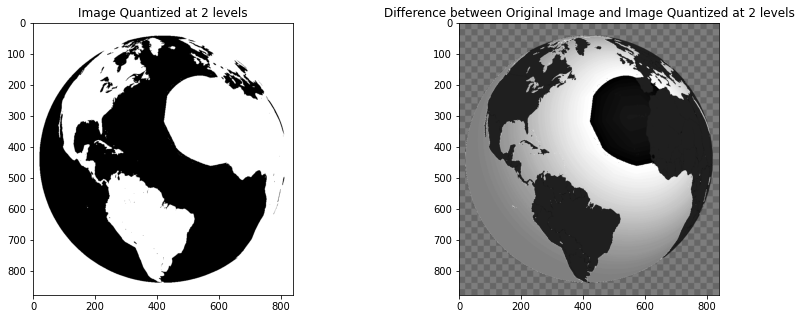

In [ ]:
#(i)
#########################################
#Write a function called quantize(arg1,arg2) that takes signal and the target number of bits as input and produces the quantized signal. 
#Notice that the target number of bits refers the number of bits with which your are quantizing the signal. 
#########################################
def quantize(signal,N):
    #Notice that signal can be either 1D (audio/speech) or 2D signal.
    #########################################
    #Find maximum and minmum values of the input signal and treat them as a and b in the provided equation of quantization
    #########################################
    b = np.max(signal)
    a = np.min(signal)

    #########################################
    #Use the appropriate formula to quantize the signal
    #########################################
    signal_quantize = np.round((signal-a)/(b-a)*(2**N-1)) * (b-a)/(2**N-1) + a

    #########################################
    #return the quantized signal
    #########################################
    return signal_quantize

#(ii)
print('x'*150,'\n')
#########################################
#Load audio / speech signals
#########################################
audio, srate_a = sf.read('/content/drive/MyDrive/DSP/PA01/music.wav')

#########################################
#Call the function qunatize() with audio / speech signal and N=4 as input arguments and obtain the quantized signal
#########################################
audio_quantized = quantize(audio,4)


#########################################
#plot the original signal and quantized signal in two different subplots. Hint : You may use plt.subplot(2,1,*)
#########################################
print("Audio Signal without Quantizing")
display(Audio("/content/drive/MyDrive/DSP/PA01/music.wav"))
plt.figure(figsize=(20,5))
plt.plot(audio)
plt.title("Audio Signal without Quantizing")
plt.show()
print("\n")

sf.write('audio_quantized.wav', audio_quantized, srate_a)
print("Audio Signal quantized at 4-bits")
display(Audio('audio_quantized.wav'))
plt.figure(figsize=(20,5))
plt.plot(audio_quantized)
plt.title("Quantised at 4-bits")
plt.show()
print("\n")

#(iii)
print('x'*150,'\n')
#########################################
#Compute the difference between original and quantized signal.
#########################################
audio_diff = audio - audio_quantized

#########################################
#Listen to quantization noise computed in the above step.
#########################################
sf.write('audio_diff.wav', audio_diff, srate_a)
print("Difference between original Audio Signal and 4-bit Quantized Audio Signal")
display(Audio('audio_diff.wav'))

#########################################
#Plot the original signal, quantized signal and difference signal in three subplots and report your observations. Hind : plt.subplot(3,1,*)
#########################################
plt.figure(figsize=(20,15))

plt.subplot(3,1,1)
plt.plot(audio)
plt.title("Original Audio Signal without Quantizing")

plt.subplot(3,1,2)
plt.plot(audio_quantized)
plt.title("Audio Signal Quantised at 4-bits")

plt.subplot(3,1,3)
plt.plot(audio_diff)
plt.title("Difference between original Audio Signal and 4-bit Quantized Audio Signal")
plt.ylim(-1.1,0.95)

plt.show()
print('\n')

#(iv)
print('x'*150,'\n')
#########################################
#Repeat part (ii) and (iii) for 3 bit, 2 bit and 1 bit and report your observations
#########################################
for i in range(3,0,-1):
    audio_quantized = quantize(audio,i)

    print("Audio without Quantizing")
    display(Audio("/content/drive/MyDrive/DSP/PA01/music.wav"))

    sf.write('audio_quantized.wav', audio_quantized, srate_a)
    print(f"Audio Signal quantized at {i}-bits")
    display(Audio('audio_quantized.wav'))

    audio_diff = audio - audio_quantized

    sf.write('audio_diff.wav', audio_diff, srate_a)
    print(f"Difference between original Audio Signal and {i}-bit Quantized Audio Signal")
    display(Audio('audio_diff.wav'))

    plt.figure(figsize=(20,15))

    plt.subplot(3,1,1)
    plt.plot(audio)
    plt.title("Original Audio Signal without Quantizing")

    plt.subplot(3,1,2)
    plt.plot(audio_quantized)
    plt.title(f"Audio Signal Quantised at {i}-bits")

    plt.subplot(3,1,3)
    plt.plot(audio_diff)
    plt.title(f"Difference between original Audio Signal and {i}-bit Quantized Audio Signal")
    plt.ylim(-1.1,0.95)

    plt.show()
    print('\n')

#(v)
print('x'*150,'\n')
#########################################
#Load the image
#########################################
img = mpimg.imread("/content/drive/MyDrive/DSP/PA01/globe.jpg")

plt.figure(figsize=(6,6))
plt.imshow(img[:,:,0],cmap="gray")
plt.title("Image without Quantizing")
plt.show()
print('\n')

#########################################
#Conduct the quantization experiments on the input image with different quantization levels
#Plot the original image and qunatized images in subplots and report your observations.
#########################################
for i in [64,32,16,8,4,2]:
    img_quantized = quantize(img,int(np.log2(i)))

    plt.figure(figsize=(14,11))
    plt.subplot(2,2,1)
    plt.imshow(img_quantized[:,:,0],cmap="gray")
    plt.title(f"Image Quantized at {i} levels")

    difference_img = img - img_quantized
    plt.subplot(2,2,2)
    plt.imshow(difference_img[:,:,0],cmap="gray")
    plt.title(f"Difference between Original Image and Image Quantized at {i} levels")

    plt.show()
    print('\n')

<h4> <b> Report your observations : </b>  

<dt> <h5> i. When we quantize the 16-bit audio signal to the 4-bit quantized version, its quality becomes poorer and there is extreme loss in clarity since there is some quantization error. </h5> </dt>

<dt> <h5> ii. The original and 4-bit quantized signal sound much better than the difference. When we play the difference between original and quantized signal, we hear the music beat faintly in a background of a lot of noise. Hence, this quantization error is righty called as "noise". This error is caused due to truncating the amplitude values to levels depending on the number of bits.</h5> </dt>

<dt> <h5> iii. When we repeat the experiment for 3,2 and 1-bit quantization, we observe that the quantized signal's quality becomes worse and there is a decrease in audio accuracy. This is because the quantization error increases as a result of lower values of quantization levels.

For 1-bit, the difference and the 1-bit quantized signal sound identical. In this case, the quantization error is maximum, yet it sounds almost the same as the quantized signal.</h5> </dt>

<dt> <h5> iv. When we perform quantization on the image, at high levels of quantization like 64 and 32, we cannot make out the difference between the original image and the quantized image. As the number of quantization levels are reduced, we can see the distinct shades of gray in the image and finally at quantization level=2, we only have the black and white image.

Another interesting observation is that at quantization level=64, in the difference image, we can see the borders of different countries in the continents which are not clearly visible in the original image.